# Цифровые технологии в профессиональной деятельности
## Раздел 2. Деревья, сети, карты
## Семинар 8. Оптическое распознавание текста (OCR)

На прошлых занятиях мы работали с готовыми данными, которые кто-то уже подготовил. Но что делать, если нужный материал не оцифрован, не машиночитаем, существует только в виде фотографий или сканов?

Огромная часть исторических и философских источников по-прежнему доступна только как изображения страниц. Дореволюционные журналы, архивные документы, малотиражные издания — всё это есть в библиотечных коллекциях, но недоступно для компьютерного анализа. OCR (Optical Character Recognition) — инструмент, который позволяет превратить эти сканы в данные.

**Материал:** двенадцать страниц из философского журнала «Вопросы философии и психологии» (1889–1918) — три статьи о сознании разных авторов.

**Чему научимся:**
- Понимать принципы работы OCR
- Использовать pytesseract для распознавания текста
- Работать со специализированной моделью для дореформенной орфографии
- Оценивать качество распознавания
- Пакетно обрабатывать коллекции страниц
- Получать на выходе корпус текстов, пригодный для дальнейшего анализа

**Практическая мотивация:** современная философия активно занимается проблемой сознания, и историкам философии важно иметь удобный доступ к дореволюционным текстам по этой теме. Сегодня мы пройдём весь путь от скана до анализируемого корпуса.

---
## Теоретический блок: как работает OCR

### Что такое OCR

**OCR (Optical Character Recognition)** — технология автоматического распознавания печатного текста на изображениях. 

**Задача:** получить на входе картинку страницы, на выходе — текстовую строку.

Отдельно выделяют **HTR (Handwritten Text Recognition)** — распознавание рукописного текста, принципиально более сложная задача: рукописный текст связный, индивидуальный и плохо сегментируется на отдельные символы. Современные HTR-системы (PyLaia, Transkribus) основаны на нейросетях-трансформерах. **Tesseract**, с которым мы работаем сегодня, — это OCR-движок, и для рукописей он подходит плохо.

### Pipeline распознавания

Процесс OCR обычно включает несколько этапов:

1. **Предобработка изображения** — выпрямление, бинаризация (перевод в чёрно-белое), повышение контраста, удаление шума
2. **Сегментация страницы** — выделение текстовых блоков, колонок, строк
3. **Сегментация строк на символы** — определение границ отдельных букв
4. **Распознавание символов** — нейросеть классифицирует каждый символ
5. **Постобработка** — словарная коррекция, исправление типичных ошибок

Tesseract выполняет все эти шаги автоматически. Чем чище и качественнее скан, тем лучше результат.

### Метрика качества — CER

**Character Error Rate (CER)** — доля ошибок на уровне символов. Считается через **расстояние Левенштейна** (минимальное число вставок, удалений и замен, нужных чтобы превратить распознанный текст в эталонный):

$$\text{CER} = \frac{I + D + S}{N}$$

где $I$ — вставки, $D$ — удаления, $S$ — замены, $N$ — общее число символов в эталоне.

Для современного печатного текста хорошие модели дают CER около 1–2%. Для исторических документов 5–10% считается приемлемым результатом.

### Проблема дореформенной орфографии

Реформа 1918 года упразднила четыре буквы: **ѣ** (ять), **ѳ** (фита), **і** (и десятеричное), **ѵ** (ижица) — а также убрала твёрдый знак (**ъ**) на конце слов. Вся литература XVIII — начала XX веков печаталась в старой орфографии.

Стандартная модель Tesseract для русского языка (`rus`) обучена на современных текстах и не знает этих символов. При распознавании дореформенного текста она просто заменяет их на ближайшие графические соответствия: ѣ → е/ь, і → i/п, ѳ → ф, это критично искажает текст.

Для решения этой проблемы существует специализированная модель `orus` из открытого проекта `iskra_ocr`. Она дообучена на сканах революционной газеты «Искра» (1900–1905) и корректно распознаёт дореформенные графемы. CER падает с 9.5% (базовая модель) до 1.3% (`orus`).

---
## Часть 1. Установка и проверка окружения

Перед началом работы нужно убедиться, что Tesseract и обе языковые модели установлены. 

Инструкция охватывает три сценария: локальная установка на Windows, локальная установка на Mac, работа в Google Colab. Выберите тот, который подходит вашей системе и среде.

Что нужно установить в любом случае:
- **Tesseract** — системная программа для распознавания
- **Языковая модель `rus`** — для современного русского текста
- **Языковая модель `orus`** — для дореформенной орфографии
- **pytesseract** — Python-обёртка для работы с Tesseract из кода

---

## Сценарий 1. Windows + локальная среда (VS Code, PyCharm, Jupyter)

### Шаг 1. Установить Tesseract

Tesseract для Windows распространяется через сборку Mannheim University. Идём по адресу:

[https://github.com/UB-Mannheim/tesseract/wiki](https://github.com/UB-Mannheim/tesseract/wiki)

Скачиваем `tesseract-ocr-w64-setup-*.exe` последней версии (на момент написания — 5.5.x). Запускаем установщик.

**Важно:** во время установки, на шаге «Choose Components», обязательно отметьте раздел **Additional language data (download)** -> **Russian**, сразу установит модель `rus`. Если пропустить — придётся ставить отдельно.

По умолчанию Tesseract устанавливается в `C:\Program Files\Tesseract-OCR\`.

### Шаг 2. Скачать модель `orus`

Идём в репозиторий проекта iskra_ocr:

`https://github.com/AButon-8/iskra_ocr`

Скачиваем файл `orus.traineddata`: [ссылка](https://github.com/AButon-8/iskra_ocr/raw/refs/heads/main/orus.traineddata)

Помещаем его в папку с моделями Tesseract:

`C:\Program Files\Tesseract-OCR\tessdata\`

Возможно, потребуются права администратора, чтобы скопировать файл в эту папку.

### Шаг 3. Проверить установку (необязательный шаг)

Открываем PowerShell или командную строку и выполняем:

```
"C:\Program Files\Tesseract-OCR\tesseract.exe" --version
"C:\Program Files\Tesseract-OCR\tesseract.exe" --list-langs
```

Во втором списке должны быть и `rus`, и `orus`.


### Шаг 4. Установить pytesseract

В терминале (PowerShell или встроенный терминал VS Code или в ячейке):

In [2]:
# Установка Python-обёртки
!pip install pytesseract pillow


[notice] A new release of pip is available: 26.0.1 -> 26.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip


### Шаг 5. Указать путь к Tesseract в коде

На Windows `pytesseract` не находит `Tesseract` автоматически — нужно прописать путь явно в начале каждой тетрадки:

Префикс `r` перед строкой важен — без него Python будет интерпретировать обратные слеши как спецсимволы.

In [3]:
import pytesseract
# Только для Windows: указать путь к tesseract.exe
pytesseract.pytesseract.tesseract_cmd = r'C:\Program Files\Tesseract-OCR\tesseract.exe'

## Сценарий 2. Mac + локальная среда

### Шаг 1. Установить Homebrew (если ещё не установлен)

Homebrew — пакетный менеджер для Mac. Установка одной командой в терминале:

```
/bin/bash -c "$(curl -fsSL https://raw.githubusercontent.com/Homebrew/install/HEAD/install.sh)"
```

### Шаг 2. Установить Tesseract и языковые пакеты

```
brew install tesseract
brew install tesseract-lang
```

Вторая команда устанавливает все языковые пакеты, включая русский.

### Шаг 3. Скачать модель `orus`

Скачиваем `orus.traineddata` из репозитория `https://github.com/AButon-8/iskra_ocr` и кладём в папку tessdata. Расположение зависит от типа процессора:

- **Apple Silicon (M1, M2, M3):** `/opt/homebrew/share/tessdata/`
- **Intel Mac:** `/usr/local/share/tessdata/`

Узнать актуальный путь:

```
brew --prefix tesseract
```

Скопировать файл:

```
cp ~/Downloads/orus.traineddata $(brew --prefix tesseract)/share/tessdata/
```

### Шаг 4. Проверить установку (необязательный шаг)

```
tesseract --version
tesseract --list-langs
```

В списке языков должны быть `rus` и `orus`.

### Шаг 5. Установить pytesseract

На Mac `pytesseract` находит Tesseract автоматически — путь прописывать не нужно.

In [4]:
# Установка Python-обёртки (выполнить один раз)
!pip install pytesseract pillow


[notice] A new release of pip is available: 26.0.1 -> 26.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip


## Сценарий 3. Google Colab

Colab — облачная среда, работающая на Linux. Установка занимает 1–2 минуты и выполняется прямо в первой ячейке тетрадки. Каждый раз при запуске новой сессии Colab нужно повторять установку, потому что окружение очищается.


In [5]:
# ДЛЯ РАБОТАЮЩИХ В КОЛАБЕ

# Устанавливаем Tesseract и русский языковой пакет
!apt-get update -qq
!apt-get install -y -qq tesseract-ocr tesseract-ocr-rus

# Скачиваем модель orus и кладём в папку tessdata
!wget -q https://github.com/AButon-8/iskra_ocr/raw/main/orus.traineddata \
  -O /usr/share/tesseract-ocr/5/tessdata/orus.traineddata

# Устанавливаем pytesseract (в Colab уже есть Pillow и pandas)
!pip install -q pytesseract

# Проверяем, что всё установлено
!tesseract --list-langs

"apt-get" �� ���� ����७��� ��� ���譥�
��������, �ᯮ��塞�� �ணࠬ��� ��� ������ 䠩���.
"apt-get" �� ���� ����७��� ��� ���譥�
��������, �ᯮ��塞�� �ணࠬ��� ��� ������ 䠩���.
"wget" �� ���� ����७��� ��� ���譥�
��������, �ᯮ��塞�� �ணࠬ��� ��� ������ 䠩���.

[notice] A new release of pip is available: 26.0.1 -> 26.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip
"tesseract" �� ���� ����७��� ��� ���譥�
��������, �ᯮ��塞�� �ணࠬ��� ��� ������ 䠩���.


В выводе команды `!tesseract` должны быть `rus` и `orus`, и если есть — можно работать.

### Загрузка файлов в Colab

Сканы нужно сделать доступными для Colab, предлагаю два способа:

**Способ 1 — загрузить через интерфейс.** В левой панели Colab кликнуть на иконку папки, перетащить файлы.

**Способ 2 — скачать сразу в Colab.**

In [6]:
!wget -q https://github.com/always1ready/dh-tools/raw/refs/heads/main/data/08_seminar/scans.zip -O data.zip
!unzip -q data.zip

"wget" �� ���� ����७��� ��� ���譥�
��������, �ᯮ��塞�� �ணࠬ��� ��� ������ 䠩���.
"unzip" �� ���� ����७��� ��� ���譥�
��������, �ᯮ��塞�� �ணࠬ��� ��� ������ 䠩���.


In [7]:
# Установка Python-обёртки (выполнить один раз)
!pip install pytesseract pillow


[notice] A new release of pip is available: 26.0.1 -> 26.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip


## Часть 1.1 Импорты

In [8]:
import os
from PIL import Image
import pandas as pd
from collections import Counter

In [9]:
# Проверяем доступные языковые модели
# В списке должны быть 'rus' (стандартная) и 'orus' (для дореформенной орфографии)
available_langs = pytesseract.get_languages()
print("Доступные модели:", available_langs)

assert 'rus' in available_langs, "Не установлена модель rus"
assert 'orus' in available_langs, "Не установлена модель orus — скачайте orus.traineddata из репозитория iskra_ocr"
print("\nВсё готово к работе!")

Доступные модели: ['eng', 'equ', 'ita', 'orus', 'osd', 'rus']

Всё готово к работе!


---
## Часть 2. Первое распознавание: сравнение моделей

Загрузим одну страницу из статьи и посмотрим, как с ней справляются обе модели.

### Pillow (PIL) — работа с изображениями

Pillow — основная библиотека Python для работы с изображениями. Историческое название PIL (Python Imaging Library) сохранилось в импорте, хотя сама библиотека давно переименована.

В нашей задаче Pillow нужен для одной простой вещи — открыть JPG-файл и передать его в pytesseract. Tesseract работает с изображениями в памяти, а не с путями к файлам.

Главный объект — класс `Image`. Его метод `Image.open(path)` загружает картинку и возвращает объект, с которым можно работать: получать размеры, конвертировать в другой формат, обрезать, поворачивать.

Размер: (2908, 4911)
Режим: RGB
Формат файла: JPEG


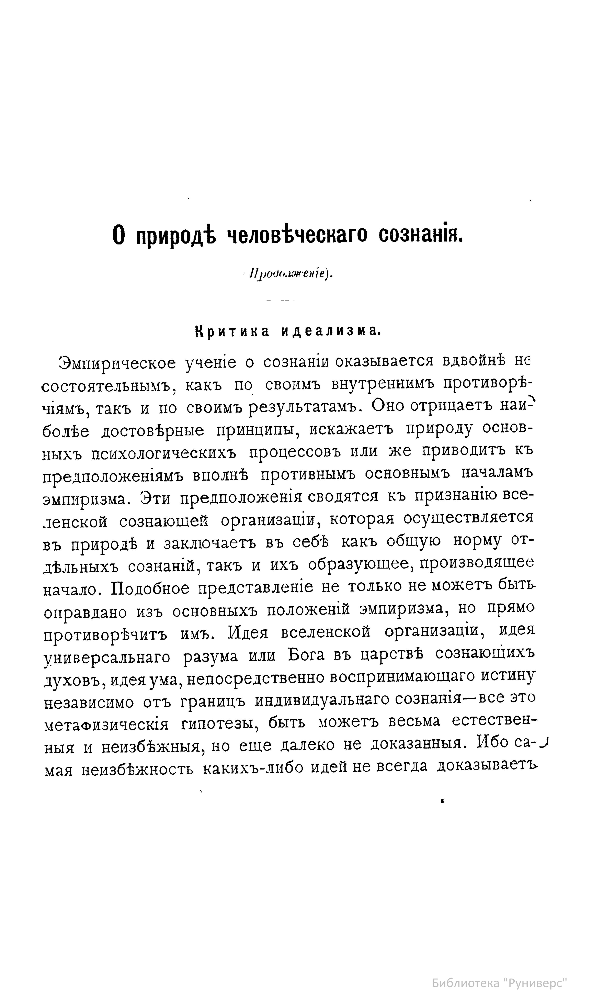

In [10]:
# Указываем путь к одной странице (статья Трубецкого о сознании)
image_path = "scans/trubetskoy_1.jpg"

# Загружаем изображение через PIL
image = Image.open(image_path)

# Смотрим базовую информацию
print(f"Размер: {image.size}")
print(f"Режим: {image.mode}")
print(f"Формат файла: {image.format}")

# Отображаем страницу прямо в тетрадке
image

### Базовая модель `rus`

Сначала запустим стандартную модель — посмотрим, что произойдёт.

In [11]:
# image_to_string — основная функция: возвращает распознанный текст
# lang='rus' указывает использовать стандартную русскую модель
text_rus = pytesseract.image_to_string(image, lang='rus')

print(text_rus[:1000])

0 природф человЪфческаго сознания.

В рю. иженте).

Критика идеализма.

Эмпирическое учене о сознаши оказывается вдвойн$ не
состоятельнымъ, какъ по своимъ внутреннимъ противорз-
шямъ, такъ и по своимъ результатамъ. Оно отрицаетъ наи-
вое достовфрные принципы, искажаетъ природу основ-
ныхъ психологическихъ процессовъ или же приводить къ
предположеюшямъ вполнЪ противнымъ основнымъ началамъ
эмпиризма. Эти предположеня сводятся къ признанию все-
ленской сознающей организащши, которая осуществляется
въ природ и заключаеть въ себф какъ общую норму от-
дфльныхъ сознанй, такъ и ихъ образующее, производящее
начало. Подобное представлеше не только не можеть быть
оправдано изъ основныхъ положенй эмпиризма, но прямо
противорфчитъ имъ. Идея вселенской организаши, идея
универсальнаго разума или Бога въ царствъ сознающихъ
духовъ, идея ума, непосредственно воспринимающаго истину
независимо отъ границъ индивидуальнаго сознання— все это
метахизичесюя гипотезы, быть можетъ весьма естествен-
ныя и неизбъж

Видно, что текст распознан, но во многих словах возникают странные сочетания символов: где должна быть ять (ѣ), модель ставит «е», «ь» или вообще «ть»; вместо «і» появляется «п» или «и»; на конце слов либо пропадает, либо искажается твёрдый знак. 

Модель просто не знает дореформенных букв и подбирает ближайшие современные.

### Специализированная модель `orus`

Запустим ту же страницу через модель, обученную на дореформенных текстах.

In [12]:
text_orus = pytesseract.image_to_string(image, lang='orus')

print(text_orus[:1000])

@0 природЪ человческаго сознани.

л родолжен?е).

Критика идеализма.

Эмпирическое ученіе о сознанши оказывается вдвойн$ нс
состоятельнымъ, какъ по своимъ внутреннимъ противор®-
чіямъ, такъ и по своимъ результатамъ. Оно отрицаетъ наиз
сольс достовырные принципы, искажаетъ природу основ-
ныхъ психологическихъ процессовъ или же приводить къ
предположенямъ вполн® противнымъ основнымъ началамъ
эмпиризма. Эти предположенія сводятся къ признаншю все-
ленской сознающей организацши, которая осуществляется
въ природ$ и заключаеть въ себ какъ общую норму от-
дѣльныхъ сознаній, такъ и ихъ образующее, производящее
начало. Подобное представленіе не только не можетъ быть
оправдано изъ основныхъ положенй эмпиризма, но прямо
противор$чить имъ. Идея вселенской организацши, идея
универсальнаго разума или Бога въ царств® сознающихъ
духовъ, идеяума, непосредственно воспринимающаго истину
независимо отъ границъ индивидуальнаго сознаня—все это
метафизическая гипотезы, быть можетъ весьма естествен-
ныя и неи

Теперь дореформенные буквы — ѣ, і, ѳ, твёрдый знак на конце слов — распознаны корректно. Текст стал более читаемым и пригодным для дальнейшего анализа.

### Параллельное сравнение

Чтобы наглядно увидеть разницу, посмотрим первые несколько строк бок о бок.

In [13]:
# Разбиваем оба результата на строки и берём первые 10
lines_rus = text_rus.strip().split('\n')[:10]
lines_orus = text_orus.strip().split('\n')[:10]

# Выводим параллельно — построчно
for i, (l_rus, l_orus) in enumerate(zip(lines_rus, lines_orus), 1):
    print(f"Строка {i}")
    print(f"  rus:  {l_rus}")
    print(f"  orus: {l_orus}")
    print()

Строка 1
  rus:  0 природф человЪфческаго сознания.
  orus: @0 природЪ человческаго сознани.

Строка 2
  rus:  
  orus: 

Строка 3
  rus:  В рю. иженте).
  orus: л родолжен?е).

Строка 4
  rus:  
  orus: 

Строка 5
  rus:  Критика идеализма.
  orus: Критика идеализма.

Строка 6
  rus:  
  orus: 

Строка 7
  rus:  Эмпирическое учене о сознаши оказывается вдвойн$ не
  orus: Эмпирическое ученіе о сознанши оказывается вдвойн$ нс

Строка 8
  rus:  состоятельнымъ, какъ по своимъ внутреннимъ противорз-
  orus: состоятельнымъ, какъ по своимъ внутреннимъ противор®-

Строка 9
  rus:  шямъ, такъ и по своимъ результатамъ. Оно отрицаетъ наи-
  orus: чіямъ, такъ и по своимъ результатамъ. Оно отрицаетъ наиз

Строка 10
  rus:  вое достовфрные принципы, искажаетъ природу основ-
  orus: сольс достовырные принципы, искажаетъ природу основ-



### Препроцессинг изображений

Качество распознавания напрямую зависит от качества изображения. Pillow позволяет применить базовые улучшения перед передачей в Tesseract:

- **Перевод в градации серого** упрощает изображение, удаляя цветовую информацию
- **Повышение контраста** делает текст более чётким относительно фона
- **Бинаризация** (только чёрный и белый) убирает все полутона

Не всегда препроцессинг улучшает результат: на чистых сканах он может оказаться излишним или даже навредить. Стоит экспериментировать и сравнивать.

Исходное: режим RGB, размер (2908, 4911)
После: режим L, размер (2908, 4911)


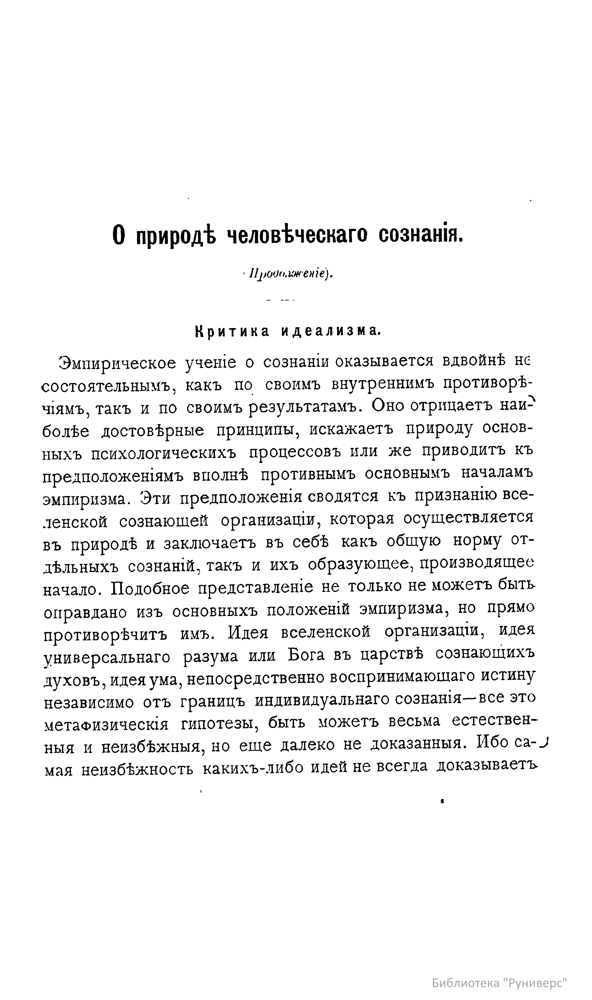

In [14]:
from PIL import ImageEnhance

# Загружаем исходное изображение
img = Image.open("scans/trubetskoy_1.jpg")

# Шаг 1. Конвертируем в градации серого (режим 'L')
img_gray = img.convert('L')

# Шаг 2. Повышаем контраст 
# Значение 1.0 — без изменений, 2.0 — двукратное усиление
enhancer = ImageEnhance.Contrast(img_gray)
img_enhanced = enhancer.enhance(1.5)

# Сравним размеры — препроцессинг не меняет геометрию
print(f"Исходное: режим {img.mode}, размер {img.size}")
print(f"После: режим {img_enhanced.mode}, размер {img_enhanced.size}")

# Покажем обработанное изображение
img_enhanced

In [15]:
# Распознаём оба варианта одной и той же моделью
text_original = pytesseract.image_to_string(img, lang='orus')
text_enhanced = pytesseract.image_to_string(img_enhanced, lang='orus')

# Сравним длину результата — обычно правильно распознанный текст длиннее
print(f"Без обработки: {len(text_original)} символов, {len(text_original.split())} слов")
print(f"С обработкой:  {len(text_enhanced)} символов, {len(text_enhanced.split())} слов")

# Выведем первые строки обоих результатов рядом
print("\n--- Без препроцессинга ---")
print(text_original[:200])
print("\n--- С препроцессингом ---")
print(text_enhanced[:200])

Без обработки: 1103 символов, 139 слов
С обработкой:  1103 символов, 138 слов

--- Без препроцессинга ---
@0 природЪ человческаго сознани.

л родолжен?е).

Критика идеализма.

Эмпирическое ученіе о сознанши оказывается вдвойн$ нс
состоятельнымъ, какъ по своимъ внутреннимъ противор®-
чіямъ, такъ и по своим

--- С препроцессингом ---
@0 природЪ человческаго сознани.

Продолзженіе).

Критика идеализма.

Эмпирическое ученіе о сознанши оказывается вдвойн$ нс
состоятельнымъ, какъ по своимъ внутреннимъ противорѣ-
чіямъ, такъ и по своим


Даже на хороших сканах результат улучшился!

### Другие методы препроцессинга

Помимо контраста, для сложных сканов часто применяют:

- **Бинаризацию** — перевод в чисто чёрно-белое изображение с пороговым значением
- **Шумоподавление** — фильтр, убирающий мелкие точки и царапины со скана
- **Повышение резкости** — подчёркивание контуров букв
- **Изменение размера** — увеличение мелкого текста для лучшего распознавания

Для демонстрации возьмём более сложный пример — скан страницы из издания «Евгения Онегина».
Загрузим изображение напрямую с GitHub.

Размер: (550, 371), режим: L


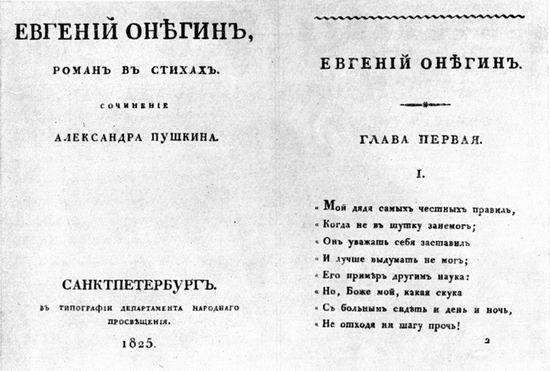

In [16]:
import requests
from io import BytesIO

# Загружаем изображение из репозитория курса
url = "https://raw.githubusercontent.com/always1ready/dh-tools/main/data/08_seminar/onegin.jpg"
response = requests.get(url)

# BytesIO — это файл в памяти, нужен потому что Image.open ждёт файл, а не байты
onegin = Image.open(BytesIO(response.content))

print(f"Размер: {onegin.size}, режим: {onegin.mode}")
onegin

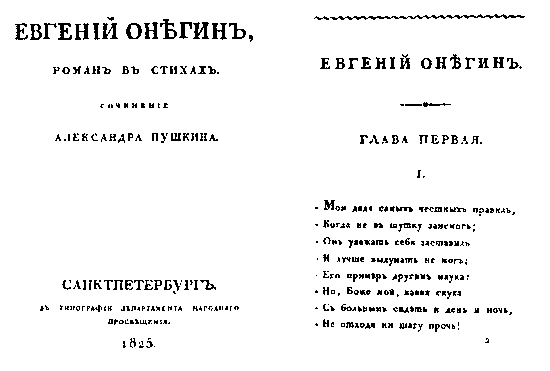

In [17]:
from PIL import ImageFilter

# 1. Бинаризация
# Сначала переводим в градации серого, потом применяем порог
# Все пиксели темнее порога становятся чёрными, светлее — белыми
onegin_gray = onegin.convert('L')
threshold = 130  # значение от 0 до 255, подбирается экспериментально
onegin_binary = onegin_gray.point(lambda p: 0 if p < threshold else 255, mode='1')

onegin_binary

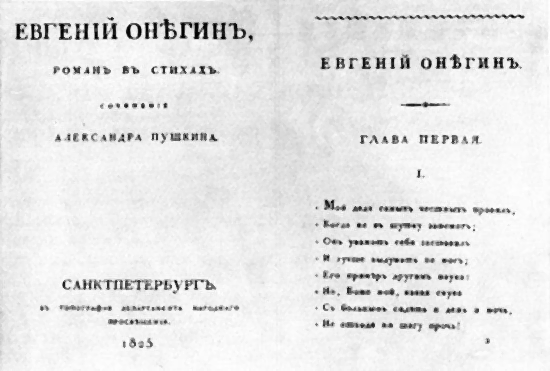

In [18]:
# 2. Шумоподавление через медианный фильтр
# Каждый пиксель заменяется на медиану по окрестности 3×3
onegin_denoised = onegin_gray.filter(ImageFilter.MedianFilter(size=3))

onegin_denoised

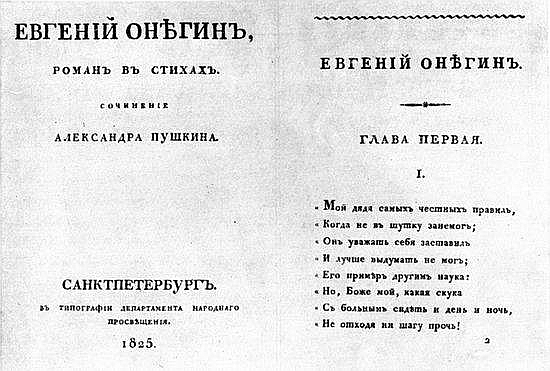

In [19]:
# 3. Повышение резкости
# Подчёркивает контуры букв, делает текст более чётким
onegin_sharp = onegin_gray.filter(ImageFilter.SHARPEN)

onegin_sharp

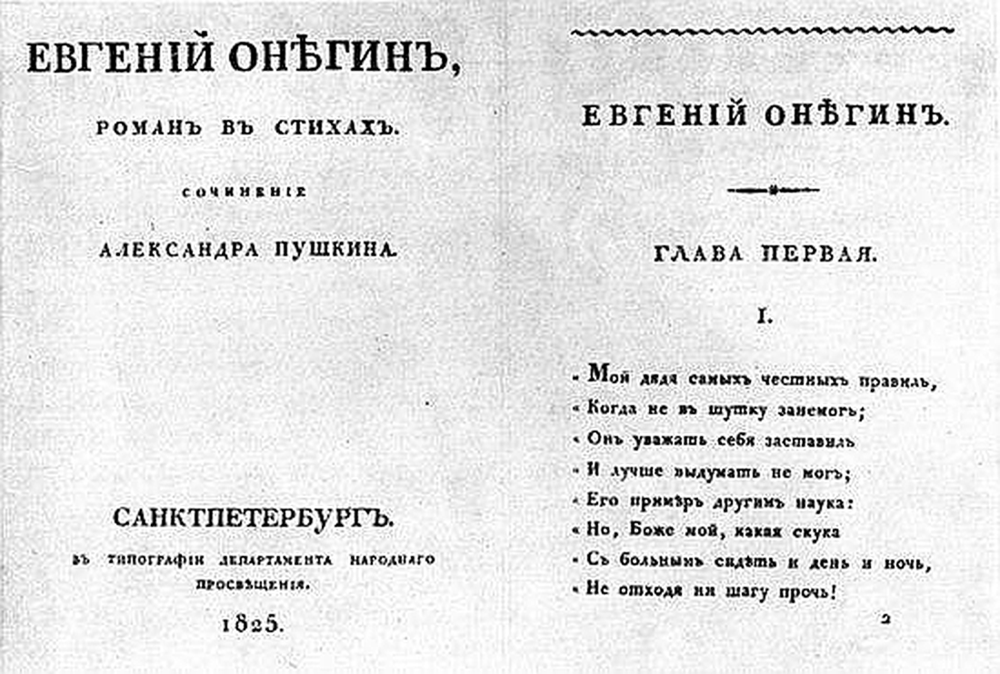

In [20]:
# 4. Увеличение размера в 2 раза
# Lanczos — алгоритм интерполяции хорошего качества
# Помогает, когда текст слишком мелкий для распознавания
new_size = (onegin.size[0] * 2, onegin.size[1] * 2)
onegin_resized = onegin_sharp.resize(new_size, Image.Resampling.LANCZOS)

onegin_resized

In [21]:
# Распознаём все варианты одной моделью и сравниваем
variants = {
    "Без обработки":   onegin,
    "Бинаризация":     onegin_binary,
    "Шумоподавление":  onegin_denoised,
    "Резкость":        onegin_sharp,
    "Увеличение 2x + резкость":   onegin_resized
}

for name, img_variant in variants.items():
    text = pytesseract.image_to_string(img_variant, lang='orus')
    words_count = len(text.split())
    print(f"{name}: {len(text)} символов, {words_count} слов")

Без обработки: 326 символов, 49 слов
Бинаризация: 354 символов, 54 слов
Шумоподавление: 177 символов, 27 слов
Резкость: 322 символов, 52 слов
Увеличение 2x + резкость: 426 символов, 66 слов


Результаты разных методов обычно различаются. На одних сканах лучше работает бинаризация, на других — увеличение размера. Универсального рецепта нет: для каждого источника стоит экспериментировать.

Для более продвинутого препроцессинга (выпрямление наклонённого текста, автоматический подбор порога, удаление линий и фоновых элементов) обычно используют `OpenCV` — это уже отдельная большая тема, разберём её в следующих курсах.

---
## Часть 3. Оценка качества распознавания

Распознанный текст не всегда корректен даже при использовании правильной модели — особенно в местах, где скан размыт, текст наклонён или есть посторонние элементы (типографские знаки, нумерация).

Tesseract возвращает не только сам текст, но и **показатель уверенности** (confidence) для каждого распознанного слова. Это число от 0 до 100, отражающее, насколько модель уверена в результате. Низкий confidence — сигнал, что слово, возможно, распознано неверно.

Получить эти данные можно через функцию `image_to_data`.

In [22]:
# image_to_data возвращает структурированные данные о каждом распознанном слове
# output_type=Output.DATAFRAME сразу даёт результат как pandas DataFrame
data = pytesseract.image_to_data(
    img_enhanced,
    lang='orus',
    output_type=pytesseract.Output.DATAFRAME
)

# Оставляем только строки с реальными словами (фильтруем служебные)
words = data[data['text'].notna() & (data['text'].str.strip() != '')]

# Смотрим, какие колонки доступны
print("Колонки:", list(words.columns))
print(f"\nВсего распознано слов: {len(words)}")
words[['text', 'conf', 'left', 'top', 'width', 'height']].head(10)

Колонки: ['level', 'page_num', 'block_num', 'par_num', 'line_num', 'word_num', 'left', 'top', 'width', 'height', 'conf', 'text']

Всего распознано слов: 138


,text,conf,left,top,width,height
4,@0,60.240467,555,1101,58,100
5,природЪ,82.932495,672,1097,388,127
6,человческаго,0.000000,1117,1095,686,101
7,сознани.,49.351025,1863,1088,409,101
11,Продолзженіе).,0.000000,1196,1312,436,70
15,Критика,90.671631,960,1597,360,74
16,идеализма.,92.104378,1384,1603,485,56
20,Эмпирическое,92.034264,291,1747,572,91
21,ученіе,2.922585,910,1739,249,94
22,о,90.694717,1208,1760,38,46


Колонки `left`, `top`, `width`, `height` — координаты слова на изображении (в пикселях). Колонка `conf` — показатель уверенности. Посмотрим распределение и найдём проблемные слова.

In [23]:
# Базовая статистика уверенности
print("Распределение confidence:")
print(words['conf'].describe())

# Слова с самой низкой уверенностью — кандидаты на ошибки
print("\nТоп-15 слов с самой низкой уверенностью:")
low_conf = words.sort_values('conf').head(15)
print(low_conf[['text', 'conf']].to_string(index=False))

Распределение confidence:
count    138.000000
mean      73.946272
std       30.527672
min        0.000000
25%       71.071293
50%       89.905296
75%       91.598577
max       93.054718
Name: conf, dtype: float64

Топ-15 слов с самой низкой уверенностью:
          text     conf
  человческаго 0.000000
Продолзженіе). 0.000000
        чіямъ, 0.000000
    противорѣ- 0.000000
          наиз 0.000000
     признаншю 0.000000
 представленще 0.000000
      дѣльныхъ 0.000000
  сознаншя-все 0.000000
 противор$чить 0.000000
          са-) 0.000000
   достовырные 0.305328
         болёе 1.888138
        ученіе 2.922585
      сознанй, 2.952614


На практике установка порога confidence (например, 50 или 70) позволяет автоматически выделить подозрительные места для ручной проверки, что особенно важно при работе с историческими источниками, где даже хорошая модель может ошибаться.

---
## Часть 4. Пакетная обработка коллекции

Теперь главное — обработать все 12 страниц и получить на выходе три текстовых файла, по одному на каждую статью: это и есть результат, ради которого мы делали всю работу.

Сканы лежат в папке `scans/`, имена файлов сгруппированы по префиксам:
- `trubetskoy_1.jpg`, `trubetskoy_2.jpg`, ... — Трубецкой, «О природе человеческого сознания»
- `chicherin_1.jpg`, `chicherin_2.jpg`, ... — «К вопросу о сознании»
- `haritonova_1.jpg`, `haritonova_2.jpg`, ... — «Реальность и самосознание»

### Работа с файловой системой через `os`

Для пакетной обработки нам нужно находить файлы в папке и создавать новые папки. Воспользуемся встроенным модулем `os`, с которым вы уже знакомы.

Основные функции, которые понадобятся:
- `os.listdir(folder)` — список всех файлов и папок внутри `folder`
- `os.path.join(folder, filename)` — собрать путь из частей (корректно для любой ОС)
- `os.makedirs(folder, exist_ok=True)` — создать папку; `exist_ok=True` означает «не ругаться, если папка уже есть»

Чтобы из всех файлов папки отобрать только страницы нужной статьи, используем то, что имена файлов начинаются с названия статьи: метод строки `.startswith()` и фильтрацию по расширению `.endswith('.jpg')`.

In [24]:
# Список названий статей — они же префиксы файлов
articles = ["trubetskoy", "chicherin", "haritonova"]

# Папка со сканами
scans_dir = "scans"

# Папка для распознанных текстов — создаём, если её ещё нет
output_dir = "text"
os.makedirs(output_dir, exist_ok=True)

In [25]:
# Обрабатываем каждую статью
for article_name in articles:

    # Находим все страницы статьи: имена файлов начинаются с названия статьи
    # Например, для "trubetskoy" подойдут trubetskoy_1.jpg, trubetskoy_2.jpg, и т.д.
    all_files = os.listdir(scans_dir)
    page_files = [f for f in all_files if f.startswith(article_name + "_") and f.endswith(".jpg")]
    page_files = sorted(page_files)  # сортируем, чтобы страницы шли по порядку

    print(f"Обрабатываю статью '{article_name}': найдено {len(page_files)} страниц")

    # Распознаём каждую страницу и собираем тексты
    pages_text = []
    for page_file in page_files:

        # Собираем полный путь к файлу: scans/trubetskoy_1.jpg
        full_path = os.path.join(scans_dir, page_file)
        img = Image.open(full_path)

        text = pytesseract.image_to_string(img, lang='orus')

        pages_text.append(text)

        print(f"  {page_file}: распознано {len(text)} символов")

    # Объединяем все страницы в один текст с разделителем между ними
    full_text = "\n\n".join(pages_text)

    # Сохраняем результат в текстовый файл
    output_file = os.path.join(output_dir, f"{article_name}.txt")
    
    with open(output_file, "w", encoding="utf-8") as f:
        f.write(full_text)

    print(f"Сохранено: {output_file}")
    print()

Обрабатываю статью 'trubetskoy': найдено 4 страниц
  trubetskoy_1.jpg: распознано 1103 символов
  trubetskoy_2.jpg: распознано 1927 символов
  trubetskoy_3.jpg: распознано 2005 символов
  trubetskoy_4.jpg: распознано 1832 символов
Сохранено: text\trubetskoy.txt

Обрабатываю статью 'chicherin': найдено 4 страниц
  chicherin_1.jpg: распознано 1411 символов
  chicherin_2.jpg: распознано 1983 символов
  chicherin_3.jpg: распознано 1972 символов
  chicherin_4.jpg: распознано 1934 символов
Сохранено: text\chicherin.txt

Обрабатываю статью 'haritonova': найдено 4 страниц
  haritonova_1.jpg: распознано 1341 символов
  haritonova_2.jpg: распознано 1829 символов
  haritonova_3.jpg: распознано 1939 символов
  haritonova_4.jpg: распознано 1865 символов
Сохранено: text\haritonova.txt



In [29]:
# Проверяем, что файлы созданы и читаются
for article_name in articles:
    file_path = os.path.join(output_dir, f"{article_name}.txt")
    with open(file_path, "r", encoding="utf-8") as f:
        text = f.read()

    print(f"{article_name}: {len(text)} символов, {len(text.split())} слов")
    print(f"  Первые 100 символов: {text[:100]}\n\n")
    print()

trubetskoy: 6873 символов, 911 слов
  Первые 100 символов: @0 природЪ человческаго сознани.

л родолжен?е).

Критика идеализма.

Эмпирическое ученіе о сознанши



chicherin: 7306 символов, 1058 слов
  Первые 100 символов: Реальность и самосознаніе.

——

Что такое реальность, и что есть реальнаго въ мір®? Это
одинъ изъ ко



haritonova: 6980 символов, 949 слов
  Первые 100 символов: Кь вопросу о сознаніи.

Нѣкоторыя наблюденйя и выводы изъ нихъ.

———

Съ давнихь временъ мыслящее че





---
## Часть 5. Первый взгляд на корпус

На выходе мы получили три текстовых файла. Теперь к ним можно применить методы, которые мы изучали раньше: какие слова чаще всего встречаются в каждой статье.

In [30]:
import re

def get_word_frequencies(text, min_length=4, top_n=15):
    
    # Оставляем только буквы (включая дореформенные ѣ, і, ѳ, ѵ)
    words = re.findall(r'[а-яёѣіѳѵъ]+', text.lower())

    # Фильтруем по длине — короткие слова обычно служебные
    words = [w for w in words if len(w) > 5]

    return Counter(words).most_common(top_n)

In [31]:
# Загружаем тексты и считаем частотности
for article_name in articles:
    text = open(os.path.join(output_dir, f"{article_name}.txt"), encoding="utf-8").read()
    top_words = get_word_frequencies(text, min_length=5, top_n=10)

    print(f"=== {article_name} ===")
    for word, count in top_words:
        print(f"  {word}: {count}")
    print()

=== trubetskoy ===
  только: 7
  идеализма: 6
  сознанія: 6
  нашего: 5
  эмпиризма: 4
  должны: 4
  субъективно: 4
  субъекта: 4
  сознаніе: 4
  сознанше: 4

=== chicherin ===
  надобно: 4
  только: 4
  можетъ: 4
  положеніе: 4
  реальность: 3
  вопросъ: 3
  существуеть: 3
  какого: 3
  декартъ: 3
  силлогизма: 3

=== haritonova ===
  сознанія: 5
  вундта: 4
  состояніе: 4
  иногда: 4
  почему: 4
  вопросу: 3
  сознаніи: 3
  сознательныхъ: 3
  опредѣленіе: 3
  представленшй: 3



Дальше можно идти разными путями: убрать стоп-слова, нормализовать формы слов (лемматизация), сравнить статьи через TF-IDF, построить тематические модели.

Но всё это становится возможным только потому, что у нас теперь есть текст. До OCR этих статей в машиночитаемом виде вообще не существовало.

---
## Обсуждение: что ещё нужно учитывать

Полученный текст не идеален. Реалистичная работа с OCR-результатами требует ещё нескольких шагов, которые мы сегодня оставляем за скобками:

**Ручная коррекция.** Даже специализированная модель ошибается. Для научной публикации текст обычно вычитывается вручную, особенно в проблемных местах, которые мы выявили через confidence.

**Нормализация орфографии.** Если задача — сравнивать дореформенные тексты с современными, имеет смысл автоматически привести их к единой орфографии (заменить ѣ → е, і → и и т.д.). Для этого есть готовые библиотеки.

**Качество скана.** Мы работали с хорошими сканами Руниверса. Микрофильмы или плохо отсканированные документы дадут гораздо более низкое качество — там потребуется препроцессинг изображений (бинаризация, выпрямление, шумоподавление).

**Сложная вёрстка.** Газеты с несколькими колонками, таблицы, иллюстрации в тексте — всё это требует более продвинутой сегментации, чем стандартный режим Tesseract.

---
## Итоги

Сегодня мы:
1. Разобрались, как устроен pipeline OCR и почему дореформенная орфография требует специализированной модели
2. Научились использовать pytesseract с разными языковыми моделями
3. Освоили оценку качества распознавания через confidence
4. Реализовали пакетную обработку коллекции сканов
5. Научились создавать реальный корпус философских текстов, которого до этого не существовало в машиночитаемом виде

### Документация
- pytesseract: https://github.com/madmaze/pytesseract
- Tesseract OCR: https://tesseract-ocr.github.io/
- Модель orus для дореформенной орфографии: https://github.com/AButon-8/iskra_ocr

### Для дальнейшего изучения
- **Transkribus** — платформа для HTR с моделями для русских рукописей, в том числе церковнославянских
- **eScriptorium** — открытый аналог Transkribus, работает на движке Kraken
- **TrOCR** — нейросеть-трансформер для распознавания, в том числе дореформенной кириллицы (модель `trocr-prereform-orthography` на Hugging Face)
- **OpenCV / Pillow** — для препроцессинга сканов плохого качества